# Question Answering

We've gone over how to retrieve documents that are relevant for a given question. 
The next step is to take those documents, take the original question, pass them both to a language model, and ask it to answer the question. 


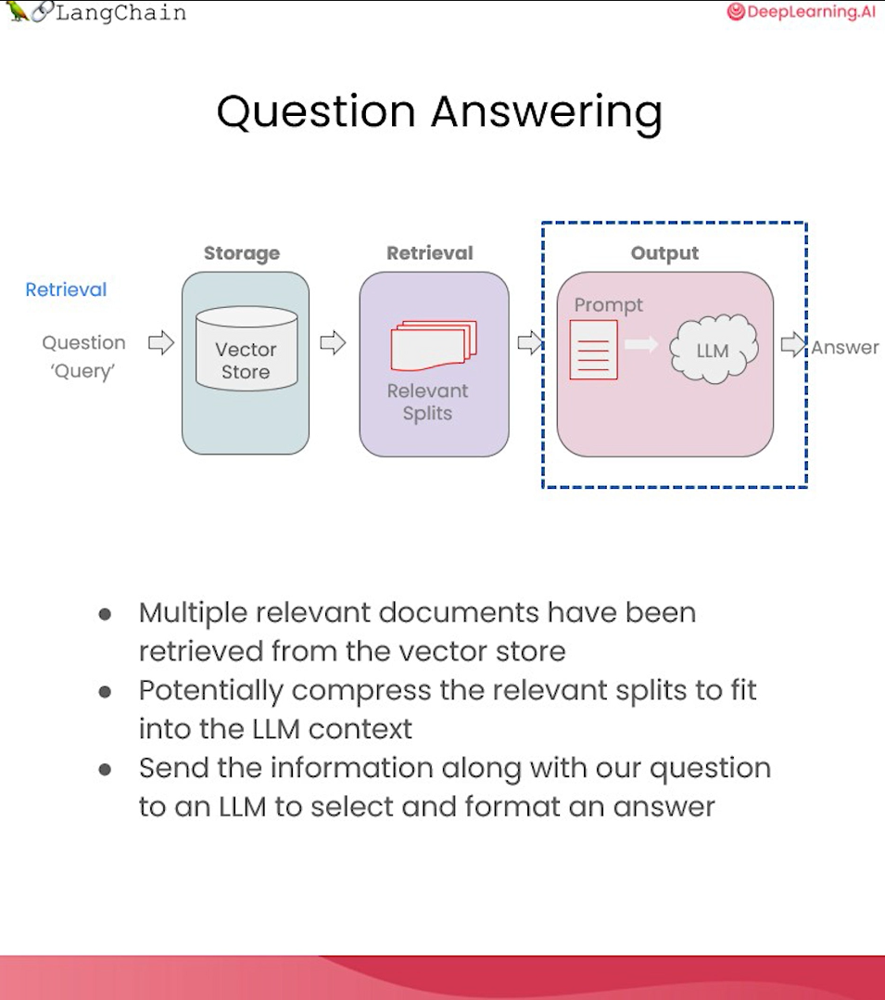

In this lesson, we're going to cover how to do question answering with the documents that you've just retrieved. 
This comes after we've done the whole storage and ingestion, after we've retrieved the relevant splits. 
Now we need to pass that into a language model to get to an answer. 

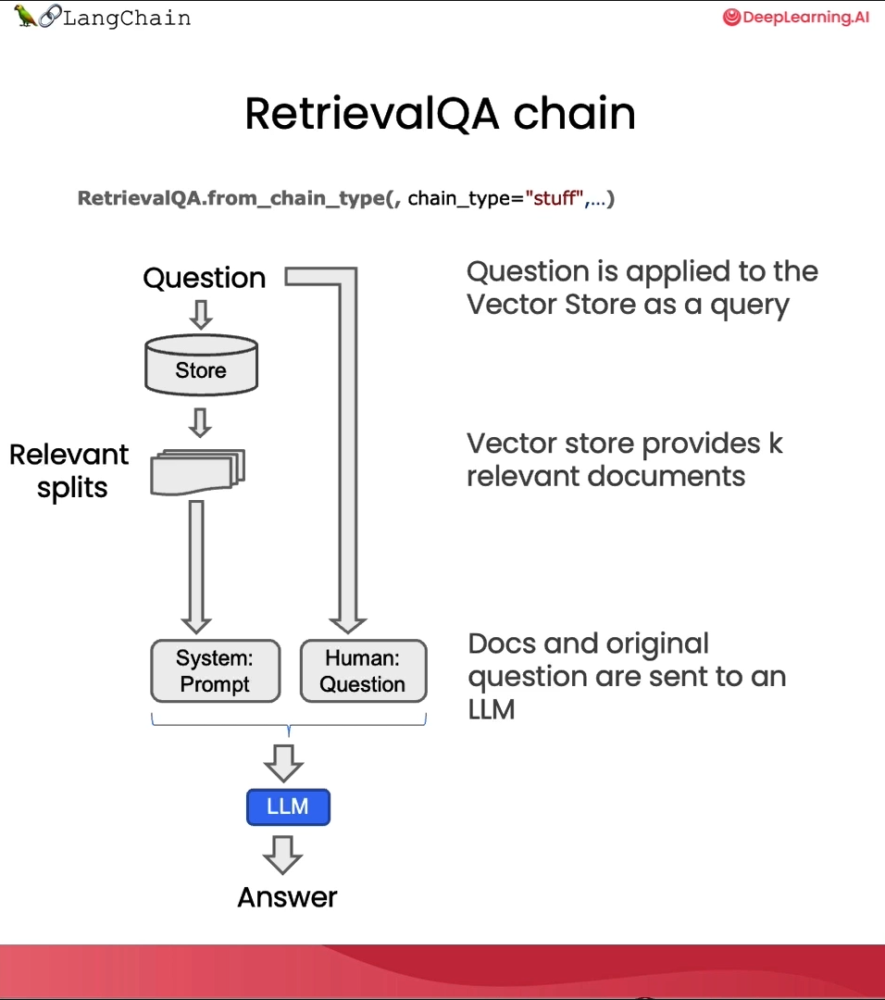

The general flow for this goes, the question comes in, 
- we look up the relevant documents, 
- we then pass those splits along with a system prompt and the human question to the language model and
- get the answer. 

By default, we just pass all the chunks into the same context window, into the same call of the language model. 


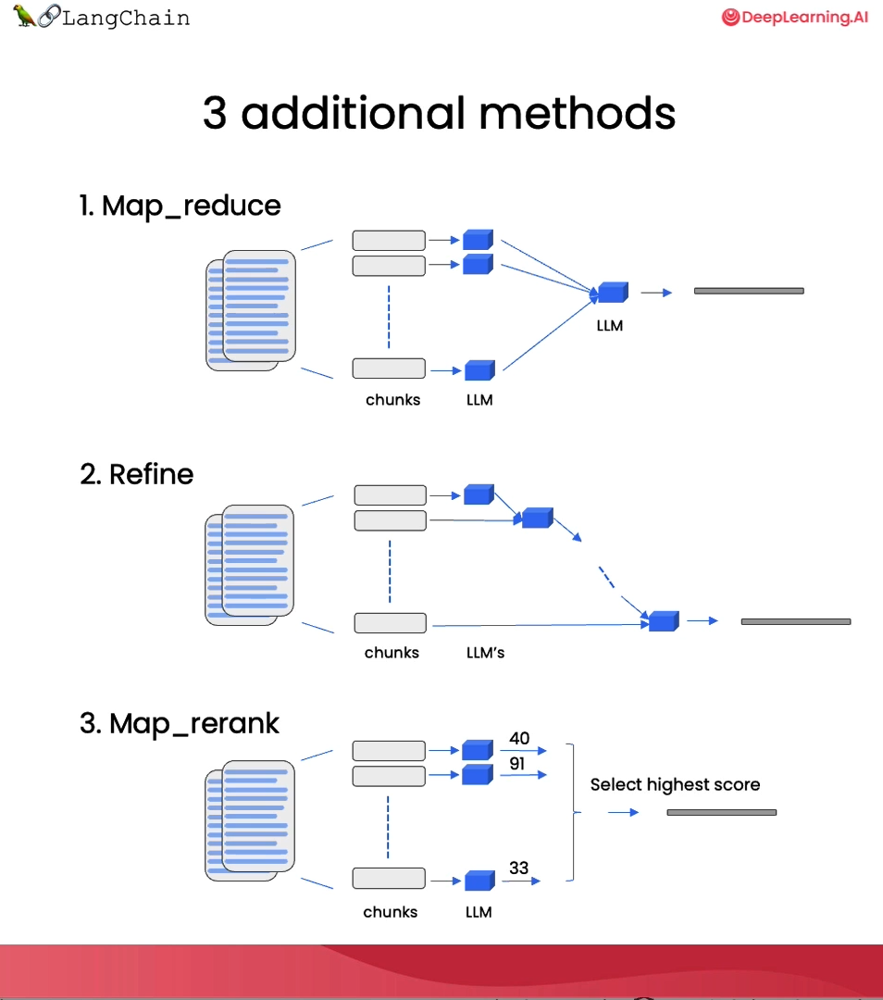

However, there are a few different methods we can use that have pros and cons to that. Most of the pros come from the fact that sometimes there can be a lot of documents and you just simply can't pass them all into the same context window. 

MapReduce, Refine, and MapRerank are three methods to get around this issue of short context windows, and we'll cover a few of them in the lesson today. 


# Overview

Recall the overall workflow for retrieval augmented generation (RAG):

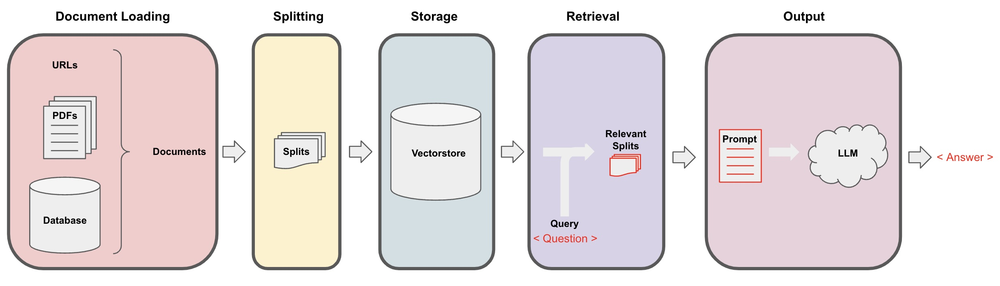

We discussed `Document Loading` and `Splitting` as well as `Storage` and `Retrieval`.

Let's load our vectorDB. 

In [ ]:
import os
import openai
import sys
sys.path.append('../..')

from dotenv import load_dotenv, find_dotenv
_ = load_dotenv(find_dotenv()) # read local .env file

openai.api_key  = os.environ['OPENAI_API_KEY']

The code below was added to assign the openai LLM version filmed until it is deprecated, currently in Sept 2023. 
LLM responses can often vary, but the responses may be significantly different when using a different model version.

In [ ]:
import datetime
current_date = datetime.datetime.now().date()
if current_date < datetime.date(2023, 9, 2):
    llm_name = "gpt-3.5-turbo-0301"
else:
    llm_name = "gpt-3.5-turbo"
print(llm_name)

In [ ]:
from langchain.vectorstores import Chroma
from langchain.embeddings.openai import OpenAIEmbeddings
persist_directory = 'docs/chroma/'
embedding = OpenAIEmbeddings()
vectordb = Chroma(persist_directory=persist_directory, embedding_function=embedding)

In [ ]:
# Check if it's correct

print(vectordb._collection.count())

*OUTPUT*

209

In [ ]:
# Make sure it's working

question = "What are major topics for this class?"
docs = vectordb.similarity_search(question,k=3)
len(docs)

*OUTPUT*

3

In [ ]:
from langchain.chat_models import ChatOpenAI
llm = ChatOpenAI(model_name=llm_name, temperature=0)   # llm_name stands for "gpt-3.5-turbo"

We're going to use the chat open AI model, GPT 3.5, and we're going to set temperature equal to zero. This is really good when we want factual answers to come out, because it's going to have a low variability and usually just give us the highest fidelity, most reliable answers. 

### RetrievalQA chain

We're then going to import the retrieval QA chain. This is doing question answering backed by a retrieval step.

In [ ]:
from langchain.chains import RetrievalQA

We can create it by passing in a language model, and then the vector database as a retriever. 

In [ ]:
qa_chain = RetrievalQA.from_chain_type(
    llm,
    retriever=vectordb.as_retriever()
)

We can then call it with the query being equal to the question that we want to ask. And then when we look at the result, we get an answer. 

In [ ]:
result = qa_chain({"query": question})

In [ ]:
result["result"]

*OUTPUT*
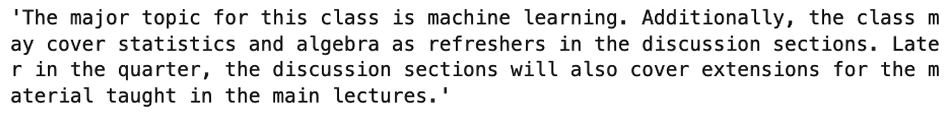

### Prompt

Let's try to understand a little bit better what's going on underneath the hood and expose a few of the different knobs that you can turn. 

The main part that's important here is the prompt that we're using. This is the prompt that takes in the documents and the question and passes it to a language model.  

Here we define a __prompt template__. It has some instructions about how to use the following pieces of context, and then it has a placeholder for a context variable. This is where the documents will go, and a placeholder for the questions variable. 


In [ ]:
from langchain.prompts import PromptTemplate

# Build prompt
template = """Use the following pieces of context to answer the question at the end. If you don't know the answer, just say that you don't know, don't try to make up an answer. Use three sentences maximum. Keep the answer as concise as possible. Always say "thanks for asking!" at the end of the answer. 
{context}
Question: {question}
Helpful Answer:"""
QA_CHAIN_PROMPT = PromptTemplate.from_template(template)


We can now create a new retrieval QA chain. We're going to use the same language model as before and the same vector databases as before, but we're going to pass in a few new arguments. We've got the return source document, so we're going to set this equals to true. 
This will let us easily inspect the documents that we retrieve. Then we're also going to pass in a prompt equals to the QA chain prompt that we defined above. 


In [ ]:
# Run chain
qa_chain = RetrievalQA.from_chain_type(
    llm,
    retriever=vectordb.as_retriever(),
    return_source_documents=True,
    chain_type_kwargs={"prompt": QA_CHAIN_PROMPT}
)

In [ ]:
question = "Is probability a class topic?"

In [ ]:
result = qa_chain({"query": question})

In [ ]:
result["result"]

*OUTPUT*
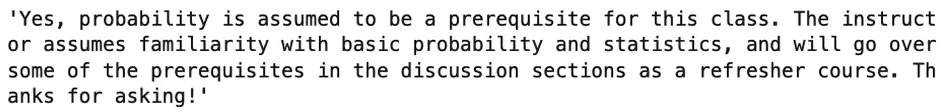

In [ ]:
result["source_documents"][0]

*OUTPUT*

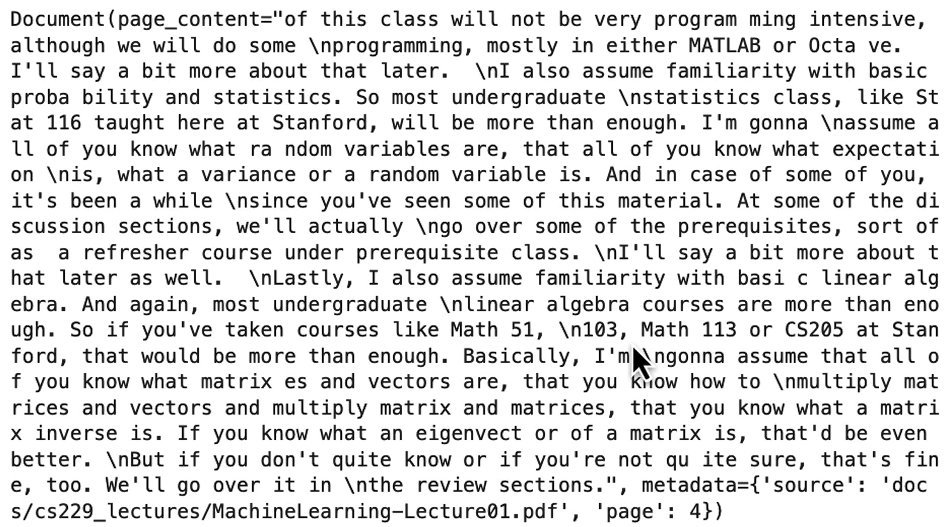

If you look through them, you should see that all the information that was answered is in one of these source documents. 

- So far, we've been using the **STUFF TECHNIQUE**, the technique that we use by default, which basically just stuffs all the documents into the final prompt. This is really good because it only involves one call to the language model. However, this does have the limitation that if there's too many documents, they may not all be able to fit inside the context window. 
- A different type of technique that we can use to do question answering over documents is the **MAP-REDUCE TECHNIQUE**. In this technique, each of the individual documents is first sent to the language model by itself to get an original answer. And then those answers are composed into a final answer with a final call to the language model. This involves many more calls to the language model, but it does have the advantage in that it can operate over arbitrarily many documents. 

### RetrievalQA chain types

In [ ]:
qa_chain_mr = RetrievalQA.from_chain_type(
    llm,
    retriever=vectordb.as_retriever(),
    chain_type="map_reduce"
)

In [ ]:
result = qa_chain_mr({"query": question})

In [ ]:
result["result"]

*OUTPUT*
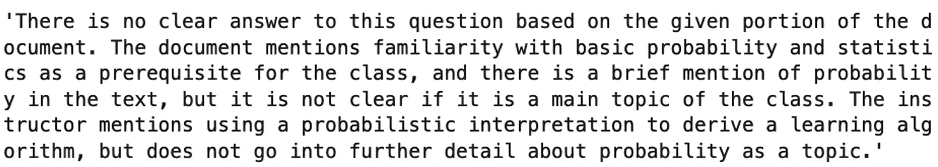

When we run the previous question through this chain, we can see another limitation of this method. Or actually, we can see two. One, it's a lot slower. Two, the result is actually worse. There is no clear answer on this question based on the given portion of the document.  This may occur because it's answering based on each document individually. And so, if there is information that's spread across two documents, it doesn't have it all in the same context. 

## UI

If you wish to experiment on the `LangChain plus platform`:

 * Go to [langchain plus platform](https://www.langchain.plus/) and sign up
 * Create an API key from your account's settings
 * Use this API key in the code below   
 * uncomment the code  
 Note, the endpoint in the video differs from the one below. Use the one below.

In [ ]:
import os
os.environ["LANGCHAIN_TRACING_V2"] = "true"
os.environ["LANGCHAIN_ENDPOINT"] = "https://api.langchain.plus"
os.environ["LANGCHAIN_API_KEY"] = "..." # replace dots with your api key

In [ ]:
qa_chain_mr = RetrievalQA.from_chain_type(
    llm,
    retriever=vectordb.as_retriever(),
    chain_type="map_reduce"
)
result = qa_chain_mr({"query": question})
result["result"]

*OUTPUT*

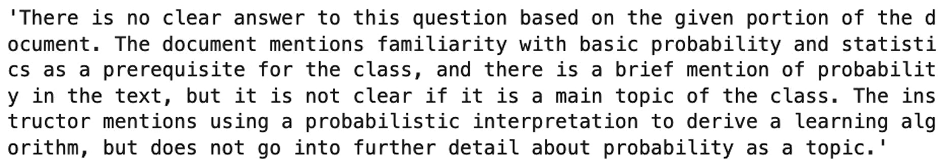

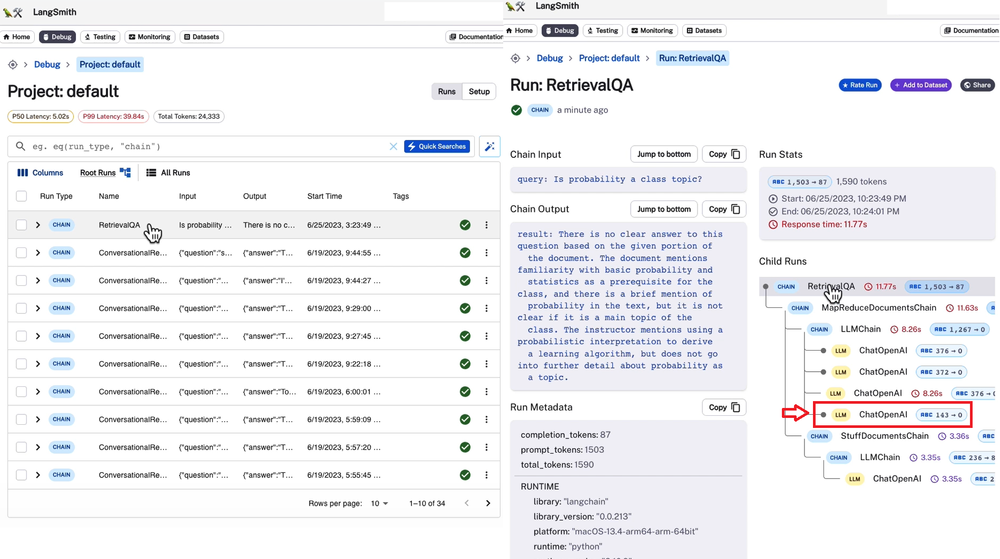

First, we have the MapReduce documents chain. This actually involves four separate calls to the language model.

If we click in to one of these calls, we can see that we have the input and the output for each of the documents.  If we go back, we can then see that after it's run over each of these documents, it's combined in a final chain, the Stuffed Documents chain, where it stuffs all these responses into the final call.

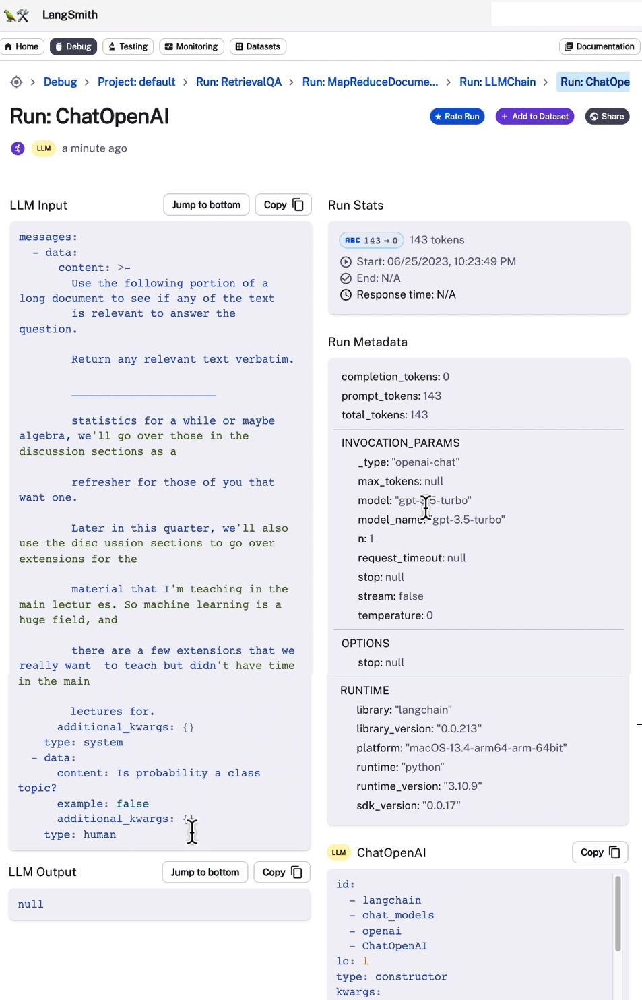

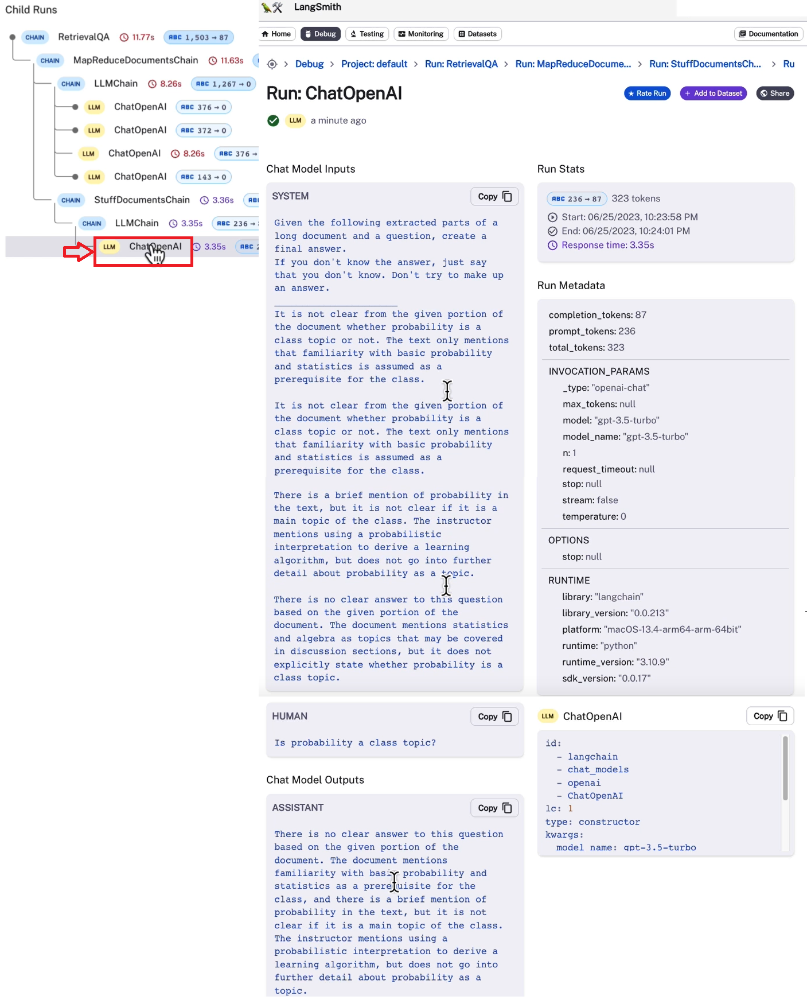

Clicking into that, we can see that we've got the system message, where we've got four summaries from the previous documents, and then the user question, and then we have the answer right there.

In [ ]:
qa_chain_mr = RetrievalQA.from_chain_type(
    llm,
    retriever=vectordb.as_retriever(),
    chain_type="refine"
)
result = qa_chain_mr({"query": question})
result["result"]

*OUTPUT*

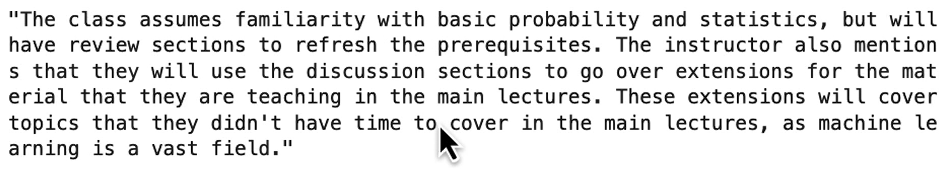

 We can do a similar thing, setting the chain type to Refine. This is a new type of chain, so let's see what it looks like under the hood. Here we can see that it's invoking the Refine Documents chain, which involves four sequential calls to an LLM chain. 

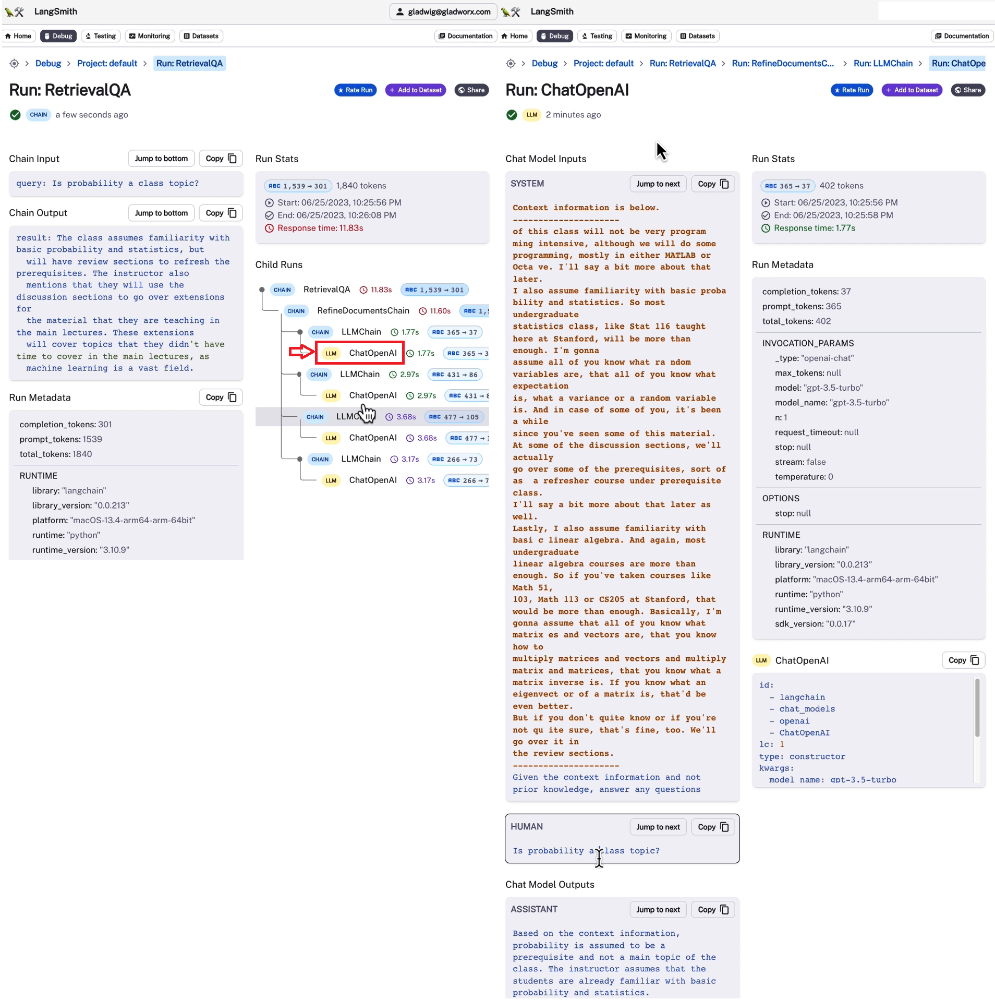

Let's take a look at the first call in this chain to see what's going on. 

Here we've got the prompt right before it's sent to the language model. We can see a system message that's made up of a few bits. This piece, "context information is below", is part of the system message, part of the prompt template that we defined ahead of time. This next bit, all this text here, this is one of the documents that we retrieved. We've then got the user question down here (HUMAN), and then we've got the answer right here (ASSISTANT).  If we then go back, we can look at the next call to the language model. 

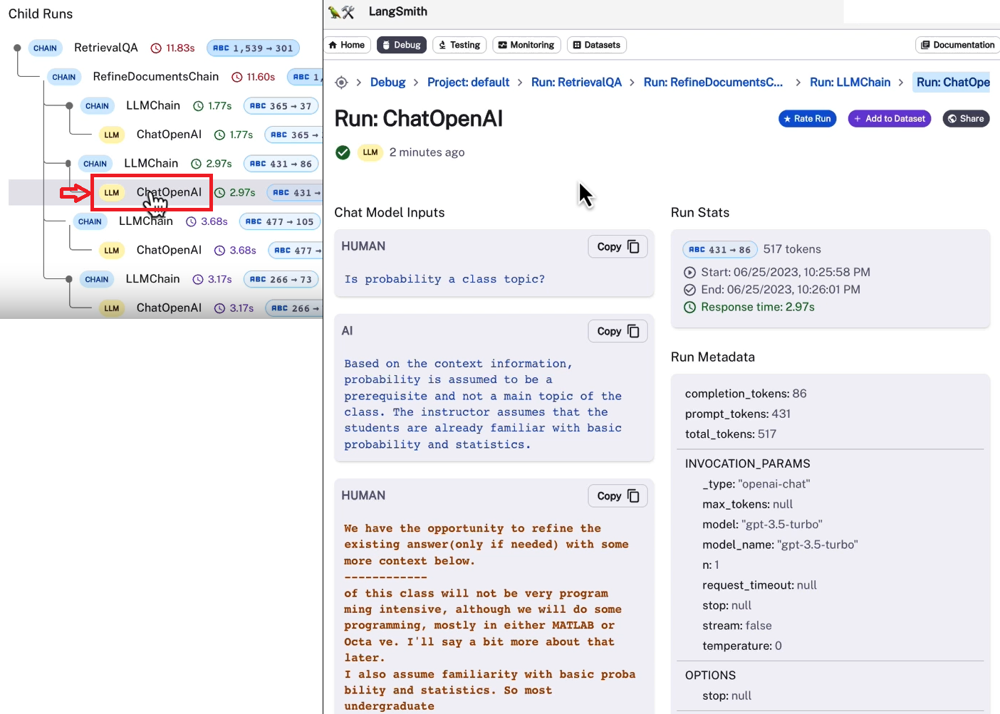

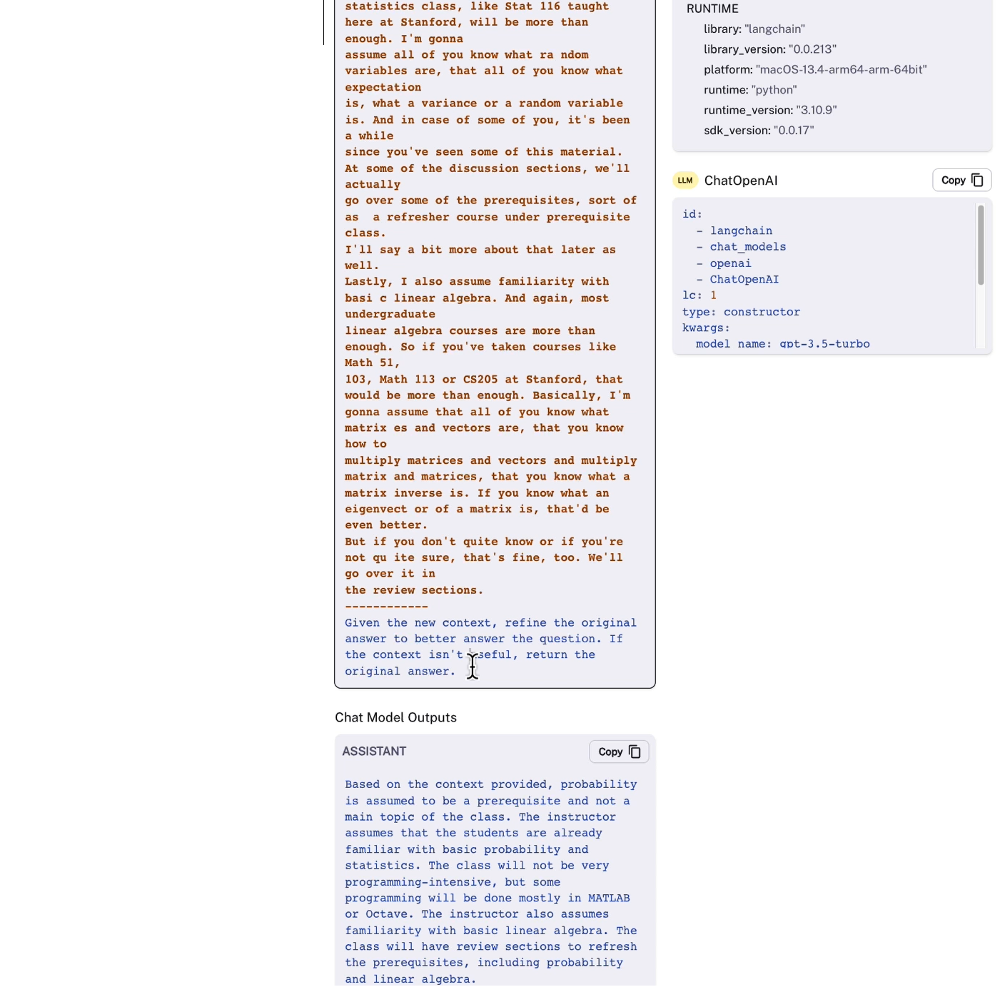

You'll notice that this is a better result than the MapReduce chain. That's because using the refined chain does allow you to combine information, albeit sequentially, and it actually encourages more carrying over of information than the MapReduce chain. 

### RetrievalQA limitations
 
QA fails to preserve conversational history.

One of the great things about chatbots and why they're becoming so popular is that you can ask follow-up questions. You can ask for clarification about previous answers.

In [ ]:
qa_chain = RetrievalQA.from_chain_type(
    llm,
    retriever=vectordb.as_retriever()
)

In [ ]:
question = "Is probability a class topic?"
result = qa_chain({"query": question})
result["result"]

In [ ]:
question = "why are those prerequesites needed?"
result = qa_chain({"query": question})
result["result"]

Note, The LLM response varies. Some responses **do** include a reference to probability which might be gleaned from referenced documents. The point is simply that the model does not have access to past questions or answers, this will be covered in the next section.